In [3]:
!pip install ultralytics opencv-python matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 914.9/914.9 kB 18.4 MB/s eta 0:00:0000:01


## Downloading dataset

In [4]:
import os
import requests

# Define the download link and file path
url = "https://public.roboflow.com/ds/EkYYi6P7Zy?key=0kho6oiSvX"
output_path = "parking_dataset.zip"

# Download the dataset
response = requests.get(url)
if response.status_code == 200:
    with open(output_path, "wb") as f:
        f.write(response.content)
    print(f"Dataset downloaded and saved as {output_path}")
else:
    print("Failed to download the dataset.")

Dataset downloaded and saved as parking_dataset.zip


In [5]:
import zipfile

# Path to the downloaded zip file
zip_path = "parking_dataset.zip"  # Replace with your downloaded zip file name
extract_to = "parking_dataset/"  # Destination folder for extraction

# Unzipping the file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f"Dataset extracted to {extract_to}")

Dataset extracted to parking_dataset/


## Data Viz

In [7]:
import os

# List the extracted folder contents
dataset_dir = "parking_dataset/"

for root, dirs, files in os.walk(dataset_dir):
    print(f"Directory: {root}")
    for file in files[:5]:  # Show the first 5 files in each folder
        print(f"  - {file}")


Directory: parking_dataset/
  - README.roboflow.txt
  - data.yaml
  - README.dataset.txt
Directory: parking_dataset/train
Directory: parking_dataset/train/images
  - 2013-03-15_13_55_09_jpg.rf.01bb6d4f456c0440600548be5a17f426.jpg
  - 2012-11-09_08_56_38_jpg.rf.e5faea6de82640533e89bb129005b288.jpg
  - 2013-02-24_16_55_11_jpg.rf.7d90cbda1e24f14255256c9e01688f72.jpg
  - 2013-03-01_18_38_01_jpg.rf.d9280d2bc99b5b6c7efadbea2faa86ec.jpg
  - 2012-12-28_18_45_15_jpg.rf.f58bc834df041b1b81339e2c7bb47ab7.jpg
Directory: parking_dataset/train/labels
  - 2013-03-14_16_06_03_jpg.rf.1d7d934f0091bb5a2f2172b76dd07379.txt
  - 2013-03-10_07_00_01_jpg.rf.08571b68e664ab056221b21eb780cade.txt
  - 2012-12-24_08_05_03_jpg.rf.d0de9e1dd0fff541eed62b977ce8d17d.txt
  - 2013-03-19_17_00_12_jpg.rf.6ee0299d385ff9073768a7668d840799.txt
  - 2013-02-26_14_54_35_jpg.rf.d0f0a7bbca0c8fcac19908d00b2eee28.txt
Directory: parking_dataset/valid
Directory: parking_dataset/valid/images
  - 2012-12-08_08_15_03_jpg.rf.19d8bb9b26b1a6

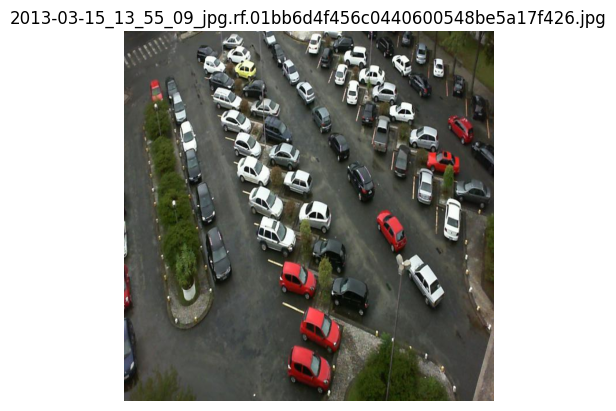

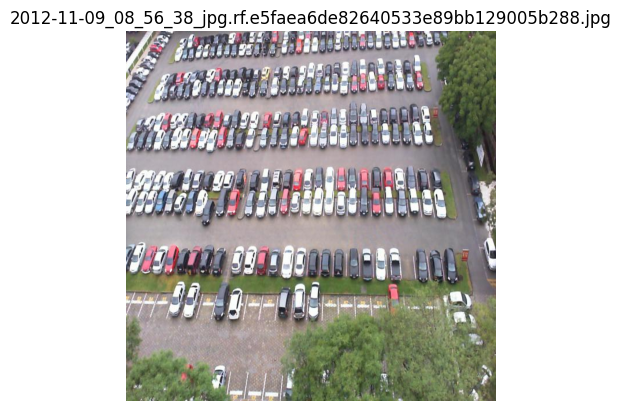

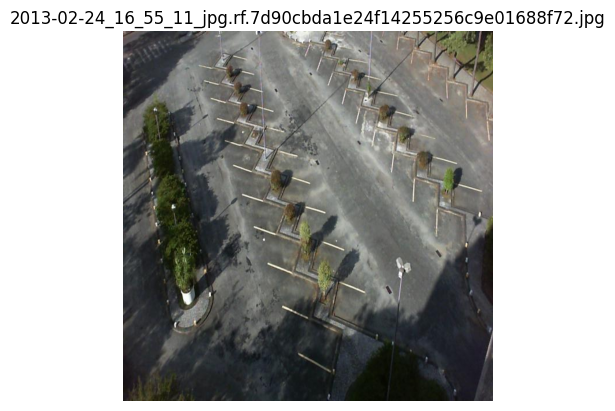

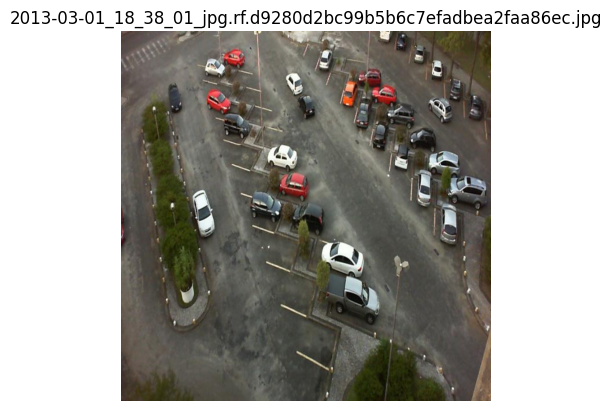

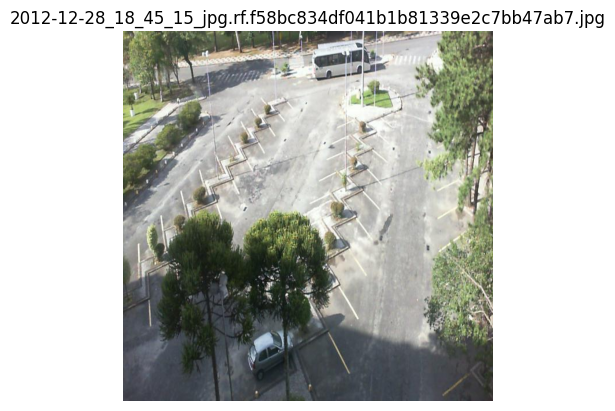

In [8]:
import matplotlib.pyplot as plt
import cv2
import os

# Display a few images from the dataset
dataset_dir = "parking_dataset/train"

image_folder = os.path.join(dataset_dir, "images")  # Adjust this path based on your structure
image_files = [f for f in os.listdir(image_folder) if f.endswith((".jpg", ".png"))][:5]

for image_file in image_files:
    img_path = os.path.join(image_folder, image_file)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for Matplotlib display
    plt.imshow(img)
    plt.title(image_file)
    plt.axis('off')
    plt.show()


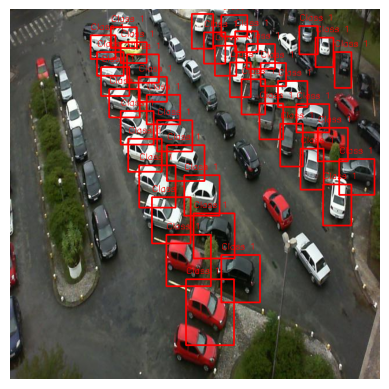

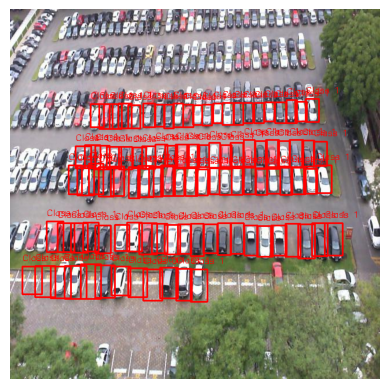

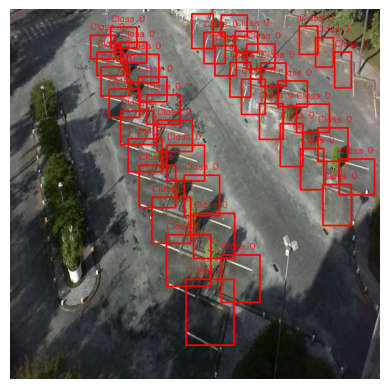

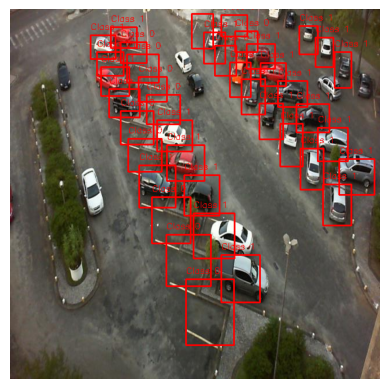

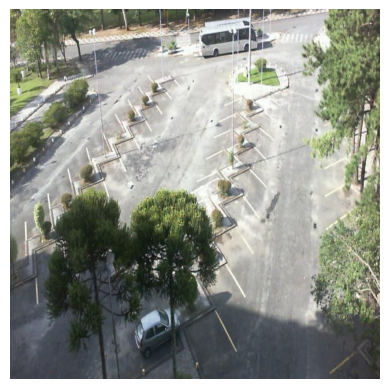

In [9]:
import os
import cv2
import matplotlib.pyplot as plt

# Paths
image_folder = "parking_dataset/train/images"
label_folder = "parking_dataset/train/labels"

def plot_image_with_boxes(image_path, label_path):
    # Load the image
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    height, width, _ = img.shape

    # Read the label file
    if os.path.exists(label_path):
        with open(label_path, "r") as file:
            boxes = file.readlines()

        # Draw bounding boxes
        for box in boxes:
            class_id, x_center, y_center, w, h = map(float, box.strip().split())
            x_center, y_center, w, h = x_center * width, y_center * height, w * width, h * height
            
            # Convert to top-left corner coordinates
            x1 = int(x_center - w / 2)
            y1 = int(y_center - h / 2)
            x2 = int(x_center + w / 2)
            y2 = int(y_center + h / 2)

            # Draw rectangle and label
            cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
            cv2.putText(img, f"Class {int(class_id)}", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

    # Show the image
    plt.imshow(img)
    plt.axis('off')
    plt.show()

# Visualize 5 sample images
image_files = os.listdir(image_folder)[:5]

for image_file in image_files:
    img_path = os.path.join(image_folder, image_file)
    label_path = os.path.join(label_folder, image_file.replace(".jpg", ".txt"))
    plot_image_with_boxes(img_path, label_path)


In [10]:
# Get all files in the label folder
label_files = os.listdir(label_folder)

# Check if the folder has any files
if label_files:
    file = label_files[6]  # Get the first file
    with open(os.path.join(label_folder, file), 'r') as f:
        print(f"Contents of {file}: \n{f.read().strip()}")
else:
    print("No files found in the label folder.")


Contents of 2013-01-19_13_45_09_jpg.rf.ced3aabf70b382b9c0ee2cebb0685333.txt: 
0 0.509375 0.8875 0.11640625 0.19140625
0 0.5515625 0.7875 0.11953125 0.171875
0 0.571875 0.671875 0.10390625 0.15703125
0 0.5953125 0.57265625 0.09609375 0.1265625
0 0.6046875 0.48828125 0.09296875 0.10703125
0 0.62734375 0.41640625 0.0875 0.09453125
0 0.6390625 0.35546875 0.07890625 0.08046875
0 0.6546875 0.31015625 0.07578125 0.07109375
0 0.66875 0.275 0.071875 0.06640625
0 0.3671875 0.903125 0.1453125 0.16796875
0 0.503125 0.49140625 0.09765625 0.09453125
0 0.5375 0.41484375 0.08515625 0.07890625
0 0.5421875 0.3640625 0.08828125 0.071875
0 0.5734375 0.315625 0.07890625 0.0640625
0 0.5765625 0.26953125 0.07578125 0.05859375
0 0.240625 0.46171875 0.07109375 0.115625
0 0.2828125 0.3984375 0.06171875 0.103125
0 0.315625 0.3453125 0.06484375 0.09609375
0 0.353125 0.30234375 0.0609375 0.07890625
0 0.3765625 0.2546875 0.06015625 0.07890625
0 0.4015625 0.22578125 0.05078125 0.0765625
0 0.10234375 0.50078125 0.071

Coordinates are already normalized for YOLO usage

## Missing/Empty files ?

#### Train files

In [11]:
import os

train_image_folder = "parking_dataset/train/images"
train_label_folder = "parking_dataset/train/labels"

# List only files (ignore subdirectories)
train_image_files_count = len([file for file in os.listdir(train_image_folder) if os.path.isfile(os.path.join(train_image_folder, file))])
train_label_files_count = len([file for file in os.listdir(train_label_folder) if os.path.isfile(os.path.join(train_label_folder, file))])

print(f"There are {train_image_files_count} files in the folder '{train_image_folder}'.")
print(f"There are {train_label_files_count} files in the folder '{train_label_folder}'.")


There are 8691 files in the folder 'parking_dataset/train/images'.
There are 8691 files in the folder 'parking_dataset/train/labels'.


In [12]:
missing_train_labels = []
empty_train_labels = []
count_1 = 0
count_2 = 0

for image_file in os.listdir(train_image_folder):
    label_file = image_file.replace(".jpg", ".txt")
    label_path = os.path.join(train_label_folder, label_file)

    if not os.path.exists(label_path):
        missing_train_labels.append(image_file)
        count_1 += 1
        
    else:
        with open(label_path, "r") as f:
            if not f.read().strip():
                empty_train_labels.append(label_file)
                count_2 += 1

print("Missing labels for images:", missing_train_labels)
print("Empty label files:", empty_train_labels)
print('\n')
print("Missing labels for images: ", count_1)
print("Empty label files:", count_2)


Missing labels for images: []
Empty label files: ['2012-12-28_18_45_15_jpg.rf.f58bc834df041b1b81339e2c7bb47ab7.txt', '2012-12-28_11_05_06_jpg.rf.b0fa8a3e12b3bdec483b54f264154dee.txt', '2012-12-28_15_15_11_jpg.rf.6c2d6e6297620c62b55a65a6c96949ab.txt', '2012-12-28_11_10_06_jpg.rf.ac92dd5270c17ad4aca37b7c50692fbd.txt', '2012-12-29_11_55_34_jpg.rf.79a2c596ede20b767a13f51387d1bff8.txt', '2012-12-28_13_10_09_jpg.rf.e4763f8e0b487d344486dad426990517.txt', '2012-12-29_14_55_38_jpg.rf.d3e1246f3dea2e4d263e7b769bad5822.txt', '2012-12-28_11_30_07_jpg.rf.88092e085c485e53694841b5304a8911.txt', '2012-12-28_16_05_12_jpg.rf.694ffba32324e8f78cfb3f70ebcf29b8.txt', '2012-12-28_10_55_06_jpg.rf.0f0555b45457a2eb20fb8b80e69babd7.txt', '2012-12-29_19_15_43_jpg.rf.1cf0757f48b43113545c264edbaae518.txt', '2012-12-29_10_25_05_jpg.rf.13a627c20b002308e809b8800071b246.txt', '2012-12-28_08_55_04_jpg.rf.5068678175c38b2dd13f46a46fd74379.txt', '2012-12-29_10_45_06_jpg.rf.6320017f99eba5e2a85e6afc84038006.txt', '2012-12-28_

In [13]:
for file in empty_train_labels: 
    with open(os.path.join(train_label_folder, file), 'r') as f:
        print(f"Contents of {file}: '{f.read()}'")

Contents of 2012-12-28_18_45_15_jpg.rf.f58bc834df041b1b81339e2c7bb47ab7.txt: ''
Contents of 2012-12-28_11_05_06_jpg.rf.b0fa8a3e12b3bdec483b54f264154dee.txt: ''
Contents of 2012-12-28_15_15_11_jpg.rf.6c2d6e6297620c62b55a65a6c96949ab.txt: ''
Contents of 2012-12-28_11_10_06_jpg.rf.ac92dd5270c17ad4aca37b7c50692fbd.txt: ''
Contents of 2012-12-29_11_55_34_jpg.rf.79a2c596ede20b767a13f51387d1bff8.txt: ''
Contents of 2012-12-28_13_10_09_jpg.rf.e4763f8e0b487d344486dad426990517.txt: ''
Contents of 2012-12-29_14_55_38_jpg.rf.d3e1246f3dea2e4d263e7b769bad5822.txt: ''
Contents of 2012-12-28_11_30_07_jpg.rf.88092e085c485e53694841b5304a8911.txt: ''
Contents of 2012-12-28_16_05_12_jpg.rf.694ffba32324e8f78cfb3f70ebcf29b8.txt: ''
Contents of 2012-12-28_10_55_06_jpg.rf.0f0555b45457a2eb20fb8b80e69babd7.txt: ''
Contents of 2012-12-29_19_15_43_jpg.rf.1cf0757f48b43113545c264edbaae518.txt: ''
Contents of 2012-12-29_10_25_05_jpg.rf.13a627c20b002308e809b8800071b246.txt: ''
Contents of 2012-12-28_08_55_04_jpg.rf.5

In [14]:
count_3 = 0
count_4 = 0

for label_file in empty_train_labels:
    label_path = os.path.join(train_label_folder, label_file)
    image_file = label_file.replace(".txt", ".jpg")
    image_path = os.path.join(train_image_folder, image_file)

    if os.path.exists(image_path):
        os.remove(image_path)
        count_3 += 1
        
    if os.path.exists(label_path):
        os.remove(label_path)
        count_4 += 1

print('Deleted images : ', count_3)
print('Deleted labels : ', count_4)

Deleted images :  189
Deleted labels :  189


#### Validate files

In [15]:
import os

valid_image_folder = "parking_dataset/valid/images"
valid_label_folder = "parking_dataset/valid/labels"

valid_image_files_count = len([file for file in os.listdir(valid_image_folder) if os.path.isfile(os.path.join(valid_image_folder, file))])
valid_label_files_count = len([file for file in os.listdir(valid_label_folder) if os.path.isfile(os.path.join(valid_label_folder, file))])

print(f"There are {valid_image_files_count} files in the folder '{valid_image_folder}'.")
print(f"There are {valid_label_files_count} files in the folder '{valid_label_folder}'.")


There are 2483 files in the folder 'parking_dataset/valid/images'.
There are 2483 files in the folder 'parking_dataset/valid/labels'.


In [16]:
missing_valid_labels = []
empty_valid_labels = []
count_1 = 0
count_2 = 0

for image_file in os.listdir(valid_image_folder):
    label_file = image_file.replace(".jpg", ".txt")
    label_path = os.path.join(valid_label_folder, label_file)

    if not os.path.exists(label_path):
        missing_valid_labels.append(image_file)
        count_1 += 1
        
    else:
        with open(label_path, "r") as f:
            if not f.read().strip():
                empty_valid_labels.append(label_file)
                count_2 += 1

print("Missing labels for images:", missing_valid_labels)
print("Empty label files:", empty_valid_labels)
print('\n')
print("Missing labels for images: ", count_1)
print("Empty label files:", count_2)


Missing labels for images: []
Empty label files: ['2012-12-29_14_05_37_jpg.rf.fa65347cc78d7f806b6feaf642715122.txt', '2012-12-28_11_40_07_jpg.rf.cd5d45804a67568e957a45c854e9c6f5.txt', '2012-12-29_17_40_41_jpg.rf.56b664eb28239904bc397d842683022f.txt', '2012-12-28_16_25_12_jpg.rf.bd5e3d1a765c63feca77ad260e2c8036.txt', '2012-12-28_10_05_05_jpg.rf.3e6e4056d12a77f9ab2781341194c688.txt', '2012-12-28_08_30_03_jpg.rf.2ae019ca50f1dfeb6d4dc711176419e2.txt', '2012-12-28_09_20_04_jpg.rf.3a57924bc5de1b40588041510eb19c50.txt', '2012-12-28_13_30_09_jpg.rf.27aec565714a3cb4c337c53e2728a170.txt', '2012-12-28_19_45_16_jpg.rf.77b54b2cc3d111ee8de1a492ea8105cf.txt', '2012-12-28_18_15_14_jpg.rf.7b32f5e243950dea7abd4564a3f5305f.txt', '2012-12-29_12_20_35_jpg.rf.baa95aa0dfc9fb1dce20df2edd1233d3.txt', '2012-12-28_12_55_08_jpg.rf.7b992646d1e81d82cb33085d36e20a5d.txt', '2012-12-28_20_05_16_jpg.rf.eed85f5a365952799130651f6c2ea37f.txt', '2012-12-29_13_45_36_jpg.rf.059fffbab4d97f323aa8de340bd03055.txt', '2012-12-28_

In [17]:
for file in empty_valid_labels: 
    with open(os.path.join(valid_label_folder, file), 'r') as f:
        print(f"Contents of {file}: '{f.read()}'")

Contents of 2012-12-29_14_05_37_jpg.rf.fa65347cc78d7f806b6feaf642715122.txt: ''
Contents of 2012-12-28_11_40_07_jpg.rf.cd5d45804a67568e957a45c854e9c6f5.txt: ''
Contents of 2012-12-29_17_40_41_jpg.rf.56b664eb28239904bc397d842683022f.txt: ''
Contents of 2012-12-28_16_25_12_jpg.rf.bd5e3d1a765c63feca77ad260e2c8036.txt: ''
Contents of 2012-12-28_10_05_05_jpg.rf.3e6e4056d12a77f9ab2781341194c688.txt: ''
Contents of 2012-12-28_08_30_03_jpg.rf.2ae019ca50f1dfeb6d4dc711176419e2.txt: ''
Contents of 2012-12-28_09_20_04_jpg.rf.3a57924bc5de1b40588041510eb19c50.txt: ''
Contents of 2012-12-28_13_30_09_jpg.rf.27aec565714a3cb4c337c53e2728a170.txt: ''
Contents of 2012-12-28_19_45_16_jpg.rf.77b54b2cc3d111ee8de1a492ea8105cf.txt: ''
Contents of 2012-12-28_18_15_14_jpg.rf.7b32f5e243950dea7abd4564a3f5305f.txt: ''
Contents of 2012-12-29_12_20_35_jpg.rf.baa95aa0dfc9fb1dce20df2edd1233d3.txt: ''
Contents of 2012-12-28_12_55_08_jpg.rf.7b992646d1e81d82cb33085d36e20a5d.txt: ''
Contents of 2012-12-28_20_05_16_jpg.rf.e

In [18]:
count_3 = 0
count_4 = 0

for label_file in empty_valid_labels:
    label_path = os.path.join(valid_label_folder, label_file)
    image_file = label_file.replace(".txt", ".jpg")
    image_path = os.path.join(valid_image_folder, image_file)

    if os.path.exists(image_path):
        os.remove(image_path)
        count_3 += 1
        
    if os.path.exists(label_path):
        os.remove(label_path)
        count_4 += 1


print('Deleted images : ', count_3)
print('Deleted labels : ', count_4)

Deleted images :  59
Deleted labels :  59


#### Test files

In [19]:
test_image_folder = "parking_dataset/test/images"
test_label_folder = "parking_dataset/test/labels"

test_image_files_count = len([file for file in os.listdir(test_image_folder) if os.path.isfile(os.path.join(test_image_folder, file))])
test_label_files_count = len([file for file in os.listdir(test_label_folder) if os.path.isfile(os.path.join(test_label_folder, file))])

print(f"There are {test_image_files_count} files in the folder '{test_image_folder}'.")
print(f"There are {test_label_files_count} files in the folder '{test_label_folder}'.")


There are 1242 files in the folder 'parking_dataset/test/images'.
There are 1242 files in the folder 'parking_dataset/test/labels'.


In [20]:
missing_test_labels = []
empty_test_labels = []
count_1 = 0
count_2 = 0

for image_file in os.listdir(test_image_folder):
    label_file = image_file.replace(".jpg", ".txt")
    label_path = os.path.join(test_label_folder, label_file)

    if not os.path.exists(label_path):
        missing_test_labels.append(image_file)
        count_1 += 1
    else:
        with open(label_path, "r") as f:
            if not f.read().strip():
                empty_test_labels.append(label_file)
                count_2 += 1

print("Missing labels for images:", missing_test_labels)
print("Empty label files:", empty_test_labels)
print('\n')
print("Missing labels for images: ", count_1)
print("Empty label files:", count_2)


Missing labels for images: []
Empty label files: ['2012-12-29_14_35_37_jpg.rf.19e29875336703bc2dfbb954a35bbef0.txt', '2012-12-29_11_35_34_jpg.rf.b612283937cb1baa346047ea6a9dacd9.txt', '2012-12-29_14_15_37_jpg.rf.917c04a8af2c1e2c2106ce43bbb60083.txt', '2012-12-28_19_05_15_jpg.rf.5c9d94a9c72bbf8154de41e4682c1cb6.txt', '2012-12-28_17_55_14_jpg.rf.ffadf6b647a0d7ae8b419370e510d0b6.txt', '2012-12-28_08_20_03_jpg.rf.57708a28af74479c6de3d9d38797cf52.txt', '2012-12-28_18_20_14_jpg.rf.c210fcd0da0cf7caf6e907bb088e208d.txt', '2012-12-28_19_50_16_jpg.rf.0c59b7dd387b77a3768cfc400b2a2c22.txt', '2012-12-28_20_55_17_jpg.rf.2e1241c843b9898ac211cc937206311d.txt', '2012-12-28_12_30_08_jpg.rf.890f5054afbf10629e7fea8190e6d566.txt', '2012-12-28_16_10_12_jpg.rf.4bb85f073e9f3188f4ef4ec6261f7185.txt', '2012-12-29_18_55_43_jpg.rf.00c78fc0a4dd2834dcb307e21893cc81.txt', '2012-12-28_20_50_17_jpg.rf.b44dec3ab63d0bdd565547140519f641.txt', '2012-12-29_12_25_35_jpg.rf.e3d04bce070b9490ebb0c3f13aaedbf7.txt', '2012-12-28_

In [21]:
for file in empty_test_labels: 
    with open(os.path.join(test_label_folder, file), 'r') as f:
        print(f"Contents of {file}: '{f.read()}'")

Contents of 2012-12-29_14_35_37_jpg.rf.19e29875336703bc2dfbb954a35bbef0.txt: ''
Contents of 2012-12-29_11_35_34_jpg.rf.b612283937cb1baa346047ea6a9dacd9.txt: ''
Contents of 2012-12-29_14_15_37_jpg.rf.917c04a8af2c1e2c2106ce43bbb60083.txt: ''
Contents of 2012-12-28_19_05_15_jpg.rf.5c9d94a9c72bbf8154de41e4682c1cb6.txt: ''
Contents of 2012-12-28_17_55_14_jpg.rf.ffadf6b647a0d7ae8b419370e510d0b6.txt: ''
Contents of 2012-12-28_08_20_03_jpg.rf.57708a28af74479c6de3d9d38797cf52.txt: ''
Contents of 2012-12-28_18_20_14_jpg.rf.c210fcd0da0cf7caf6e907bb088e208d.txt: ''
Contents of 2012-12-28_19_50_16_jpg.rf.0c59b7dd387b77a3768cfc400b2a2c22.txt: ''
Contents of 2012-12-28_20_55_17_jpg.rf.2e1241c843b9898ac211cc937206311d.txt: ''
Contents of 2012-12-28_12_30_08_jpg.rf.890f5054afbf10629e7fea8190e6d566.txt: ''
Contents of 2012-12-28_16_10_12_jpg.rf.4bb85f073e9f3188f4ef4ec6261f7185.txt: ''
Contents of 2012-12-29_18_55_43_jpg.rf.00c78fc0a4dd2834dcb307e21893cc81.txt: ''
Contents of 2012-12-28_20_50_17_jpg.rf.b

Let's delete empty label files along with their corresponding image files for better data prep

In [22]:
count_3 = 0
count_4 = 0

for label_file in empty_test_labels:
    label_path = os.path.join(test_label_folder, label_file)
    image_file = label_file.replace(".txt", ".jpg")
    image_path = os.path.join(test_image_folder, image_file)

    if os.path.exists(image_path):
        os.remove(image_path)
        count_3 += 1
        
    if os.path.exists(label_path):
        os.remove(label_path)
        count_4 += 1


print('Deleted images : ', count_3)
print('Deleted labels : ', count_4)

Deleted images :  26
Deleted labels :  26


## Training

## Grid search for YOLOv8 types, Epochs and batch size

In [23]:
from ultralytics import YOLO
from itertools import product

# Define the grid search parameters
models = ['yolov8n.pt', 'yolov8s.pt', 'yolov8m.pt']  # Model sizes: nano, small, medium
batch_sizes = [8, 16, 32]
img_sizes = [640]
epochs = [5, 10, 20]

# Collect all parameter combinations
parameter_grid = list(product(models, batch_sizes, img_sizes, epochs))


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [24]:
import os
from ultralytics import YOLO

results = []

for model_path, batch, img_size, epoch in parameter_grid:
    print('__________________________________________________________________________________')
    print(f"Training with model: {model_path}, batch: {batch}, image size: {img_size}, epochs: {epoch}")
    
    # Load YOLO model
    model = YOLO(model_path)
    
    # Train the model
    results_dir = f"experiment_{model_path.split('.')[0]}_batch{batch}_img{img_size}_epoch{epoch}"
    model.train(
        data='/kaggle/working/parking_dataset/data.yaml',
        epochs=epoch,
        batch=batch,
        imgsz=img_size,
        name=results_dir,
        project='parking_project',
        save=True  # Save the model weights for evaluation
    )

    # Evaluate and store best mAP metric
    metrics = model.val()  # Get validation metrics
    best_map50 = metrics.box.map50 if metrics.box else 0  # Directly access mAP@50

    results.append((model_path, batch, img_size, epoch, best_map50))

__________________________________________________________________________________
Training with model: yolov8n.pt, batch: 16, image size: 640, epochs: 5


100%|██████████| 6.25M/6.25M [00:00<00:00, 80.4MB/s]


Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/parking_dataset/data.yaml, epochs=5, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=parking_project, name=experiment_yolov8n_batch16_img640_epoch5, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, s

100%|██████████| 755k/755k [00:00<00:00, 16.7MB/s]


Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 70.9MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/parking_dataset/train/labels... 8502 images, 0 backgrounds, 0 corrupt: 100%|██████████| 8502/8502 [00:08<00:00, 990.76it/s] 


train: New cache created: /kaggle/working/parking_dataset/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.2 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/working/parking_dataset/valid/labels... 2424 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2424/2424 [00:02<00:00, 891.55it/s] 

val: New cache created: /kaggle/working/parking_dataset/valid/labels.cache


Plotting labels to parking_project/experiment_yolov8n_batch16_img640_epoch5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to parking_project/experiment_yolov8n_batch16_img640_epoch5
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      7.68G      1.432      1.212      1.081        484        640: 100%|██████████| 532/532 [01:50<00:00,  4.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:22<00:00,  3.32it/s]


                   all       2424     143316      0.962      0.962       0.97      0.703

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      5.46G     0.9682     0.5971     0.9128        575        640: 100%|██████████| 532/532 [01:48<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:21<00:00,  3.59it/s]


                   all       2424     143316      0.971      0.959      0.986      0.781

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      5.08G     0.8389     0.5178     0.8812        458        640: 100%|██████████| 532/532 [01:48<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:20<00:00,  3.69it/s]


                   all       2424     143316      0.977      0.973      0.991      0.833

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      8.21G     0.7525     0.4654     0.8609        765        640: 100%|██████████| 532/532 [01:46<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:20<00:00,  3.76it/s]


                   all       2424     143316      0.972      0.982      0.992      0.859

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      5.88G     0.6805     0.4275     0.8463        356        640: 100%|██████████| 532/532 [01:46<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:20<00:00,  3.79it/s]


                   all       2424     143316      0.984      0.983      0.993      0.875

5 epochs completed in 0.182 hours.
Optimizer stripped from parking_project/experiment_yolov8n_batch16_img640_epoch5/weights/last.pt, 6.2MB
Optimizer stripped from parking_project/experiment_yolov8n_batch16_img640_epoch5/weights/best.pt, 6.2MB

Validating parking_project/experiment_yolov8n_batch16_img640_epoch5/weights/best.pt...
Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:49<00:00,  1.53it/s]


                   all       2424     143316      0.984      0.983      0.993      0.875
           space-empty       2062      73629      0.993      0.975      0.994      0.884
        space-occupied       1967      69687      0.976      0.991      0.993      0.865


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 2.1ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to parking_project/experiment_yolov8n_batch16_img640_epoch5
Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/working/parking_dataset/valid/labels.cache... 2424 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2424/2424 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   1%|▏         | 2/152 [00:00<00:56,  2.65it/s]

WARNING ⚠️ NMS time limit 2.800s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 152/152 [00:50<00:00,  3.02it/s]


                   all       2424     143316      0.984      0.978      0.993      0.875
           space-empty       2062      73629      0.993      0.974      0.994      0.886
        space-occupied       1967      69687      0.976      0.982      0.992      0.863


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 3.9ms inference, 0.0ms loss, 2.5ms postprocess per image
Results saved to parking_project/experiment_yolov8n_batch16_img640_epoch52
__________________________________________________________________________________
Training with model: yolov8n.pt, batch: 32, image size: 640, epochs: 5
Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/kaggle/working/parking_dataset/data.yaml, epochs=5, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=parking_project, name=experiment_yolov8n_batch32_img640_epoch5, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save

train: Scanning /kaggle/working/parking_dataset/train/labels.cache... 8502 images, 0 backgrounds, 0 corrupt: 100%|██████████| 8502/8502 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /kaggle/working/parking_dataset/valid/labels.cache... 2424 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2424/2424 [00:00<?, ?it/s]


Plotting labels to parking_project/experiment_yolov8n_batch32_img640_epoch5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to parking_project/experiment_yolov8n_batch32_img640_epoch5
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      14.7G      1.524      1.395      1.115       1829        640: 100%|██████████| 266/266 [01:48<00:00,  2.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:22<00:00,  1.69it/s]


                   all       2424     143316      0.941       0.95      0.968      0.672

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      11.4G      0.994     0.6175     0.9164       1936        640: 100%|██████████| 266/266 [01:46<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:20<00:00,  1.82it/s]


                   all       2424     143316      0.972      0.971      0.986      0.788

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      10.6G     0.8597     0.5345     0.8835       1630        640: 100%|██████████| 266/266 [01:45<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:20<00:00,  1.85it/s]


                   all       2424     143316       0.97      0.973      0.991       0.83

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      13.9G     0.7735     0.4784     0.8635       2411        640: 100%|██████████| 266/266 [01:45<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:19<00:00,  1.92it/s]


                   all       2424     143316      0.976      0.977      0.991      0.834

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5        11G     0.6961     0.4342     0.8478       2015        640: 100%|██████████| 266/266 [01:46<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:19<00:00,  1.95it/s]


                   all       2424     143316      0.982      0.983      0.993      0.869

5 epochs completed in 0.180 hours.
Optimizer stripped from parking_project/experiment_yolov8n_batch32_img640_epoch5/weights/last.pt, 6.2MB
Optimizer stripped from parking_project/experiment_yolov8n_batch32_img640_epoch5/weights/best.pt, 6.2MB

Validating parking_project/experiment_yolov8n_batch32_img640_epoch5/weights/best.pt...
Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:49<00:00,  1.30s/it]


                   all       2424     143316      0.982      0.983      0.993      0.869
           space-empty       2062      73629      0.981      0.984      0.993      0.879
        space-occupied       1967      69687      0.982      0.983      0.993      0.859


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 2.2ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to parking_project/experiment_yolov8n_batch32_img640_epoch5
Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /kaggle/working/parking_dataset/valid/labels.cache... 2424 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2424/2424 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:54<00:00,  1.40it/s]


                   all       2424     143316      0.982      0.983      0.993      0.871
           space-empty       2062      73629      0.981      0.984      0.993      0.882
        space-occupied       1967      69687      0.982      0.983      0.993      0.861


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 3.8ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to parking_project/experiment_yolov8n_batch32_img640_epoch52
__________________________________________________________________________________
Training with model: yolov8s.pt, batch: 16, image size: 640, epochs: 5


100%|██████████| 21.5M/21.5M [00:00<00:00, 96.9MB/s]

Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/kaggle/working/parking_dataset/data.yaml, epochs=5, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=parking_project, name=experiment_yolov8s_batch16_img640_epoch5, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, s

Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

train: Scanning /kaggle/working/parking_dataset/train/labels.cache... 8502 images, 0 backgrounds, 0 corrupt: 100%|██████████| 8502/8502 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /kaggle/working/parking_dataset/valid/labels.cache... 2424 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2424/2424 [00:00<?, ?it/s]


Plotting labels to parking_project/experiment_yolov8s_batch16_img640_epoch5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to parking_project/experiment_yolov8s_batch16_img640_epoch5
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      9.28G       1.21     0.8042      1.033        484        640: 100%|██████████| 532/532 [02:47<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:24<00:00,  3.05it/s]


                   all       2424     143316      0.944      0.956       0.98      0.798

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      7.05G     0.7634      0.443     0.8697        575        640: 100%|██████████| 532/532 [02:42<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:24<00:00,  3.13it/s]

                   all       2424     143316      0.977      0.975      0.989      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      6.71G     0.6477     0.3949     0.8447        458        640: 100%|██████████| 532/532 [02:42<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:24<00:00,  3.13it/s]

                   all       2424     143316      0.977      0.976      0.993      0.896



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      9.79G     0.5618     0.3525     0.8282        765        640: 100%|██████████| 532/532 [02:41<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:23<00:00,  3.18it/s]

                   all       2424     143316      0.987      0.988      0.994      0.918



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      7.16G     0.4912     0.3111      0.816        356        640: 100%|██████████| 532/532 [02:41<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:24<00:00,  3.16it/s]

                   all       2424     143316      0.989      0.989      0.994      0.935



5 epochs completed in 0.263 hours.
Optimizer stripped from parking_project/experiment_yolov8s_batch16_img640_epoch5/weights/last.pt, 22.5MB
Optimizer stripped from parking_project/experiment_yolov8s_batch16_img640_epoch5/weights/best.pt, 22.5MB

Validating parking_project/experiment_yolov8s_batch16_img640_epoch5/weights/best.pt...
Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:54<00:00,  1.40it/s]


                   all       2424     143316      0.989      0.989      0.994      0.935
           space-empty       2062      73629      0.982      0.997      0.994      0.943
        space-occupied       1967      69687      0.997       0.98      0.994      0.928


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 4.6ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to parking_project/experiment_yolov8s_batch16_img640_epoch5
Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /kaggle/working/parking_dataset/valid/labels.cache... 2424 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2424/2424 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 152/152 [01:01<00:00,  2.45it/s]


                   all       2424     143316      0.989      0.989      0.994      0.938
           space-empty       2062      73629      0.982      0.997      0.994      0.947
        space-occupied       1967      69687      0.997       0.98      0.994       0.93


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 9.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to parking_project/experiment_yolov8s_batch16_img640_epoch52
__________________________________________________________________________________
Training with model: yolov8s.pt, batch: 32, image size: 640, epochs: 5
Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/kaggle/working/parking_dataset/data.yaml, epochs=5, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=parking_project, name=experiment_yolov8s_batch32_img640_epoch5, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save

train: Scanning /kaggle/working/parking_dataset/train/labels.cache... 8502 images, 0 backgrounds, 0 corrupt: 100%|██████████| 8502/8502 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /kaggle/working/parking_dataset/valid/labels.cache... 2424 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2424/2424 [00:00<?, ?it/s]


Plotting labels to parking_project/experiment_yolov8s_batch32_img640_epoch5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to parking_project/experiment_yolov8s_batch32_img640_epoch5
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5        12G      1.301     0.9148      1.069       1829        640: 100%|██████████| 266/266 [02:43<00:00,  1.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:24<00:00,  1.57it/s]


                   all       2424     143316      0.943      0.965      0.979      0.786

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      14.3G     0.7826     0.4514     0.8725       1936        640: 100%|██████████| 266/266 [02:40<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:23<00:00,  1.64it/s]

                   all       2424     143316      0.976      0.976      0.992      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      13.6G     0.6574     0.3963     0.8453       1630        640: 100%|██████████| 266/266 [02:39<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:23<00:00,  1.62it/s]

                   all       2424     143316      0.947      0.952      0.992      0.874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      11.8G     0.5801     0.3544     0.8303       2411        640: 100%|██████████| 266/266 [02:39<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:23<00:00,  1.65it/s]

                   all       2424     143316      0.981      0.982      0.991       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5        14G     0.4993     0.3138      0.817       2015        640: 100%|██████████| 266/266 [02:40<00:00,  1.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:23<00:00,  1.64it/s]

                   all       2424     143316      0.992       0.99      0.994      0.938



5 epochs completed in 0.259 hours.
Optimizer stripped from parking_project/experiment_yolov8s_batch32_img640_epoch5/weights/last.pt, 22.5MB
Optimizer stripped from parking_project/experiment_yolov8s_batch32_img640_epoch5/weights/best.pt, 22.5MB

Validating parking_project/experiment_yolov8s_batch32_img640_epoch5/weights/best.pt...
Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:52<00:00,  1.39s/it]


                   all       2424     143316      0.992       0.99      0.994      0.938
           space-empty       2062      73629      0.995      0.988      0.994      0.944
        space-occupied       1967      69687       0.99      0.992      0.994      0.932


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 4.6ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to parking_project/experiment_yolov8s_batch32_img640_epoch5
Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs


val: Scanning /kaggle/working/parking_dataset/valid/labels.cache... 2424 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2424/2424 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [01:03<00:00,  1.20it/s]


                   all       2424     143316      0.992       0.99      0.994      0.941
           space-empty       2062      73629      0.995      0.988      0.994      0.947
        space-occupied       1967      69687       0.99      0.992      0.994      0.934


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 9.3ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to parking_project/experiment_yolov8s_batch32_img640_epoch52
__________________________________________________________________________________
Training with model: yolov8m.pt, batch: 16, image size: 640, epochs: 5


100%|██████████| 49.7M/49.7M [00:00<00:00, 246MB/s]


Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/kaggle/working/parking_dataset/data.yaml, epochs=5, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=parking_project, name=experiment_yolov8m_batch16_img640_epoch5, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, s

train: Scanning /kaggle/working/parking_dataset/train/labels.cache... 8502 images, 0 backgrounds, 0 corrupt: 100%|██████████| 8502/8502 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /kaggle/working/parking_dataset/valid/labels.cache... 2424 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2424/2424 [00:00<?, ?it/s]


Plotting labels to parking_project/experiment_yolov8m_batch16_img640_epoch5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to parking_project/experiment_yolov8m_batch16_img640_epoch5
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      11.8G      1.079     0.6871       1.02        484        640: 100%|██████████| 532/532 [05:03<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:37<00:00,  2.04it/s]


                   all       2424     143316      0.961      0.959      0.981      0.804

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      9.62G     0.6593     0.3894     0.8678        575        640: 100%|██████████| 532/532 [04:58<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:36<00:00,  2.08it/s]


                   all       2424     143316      0.974      0.975      0.991      0.899

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      9.37G     0.5549     0.3499     0.8411        458        640: 100%|██████████| 532/532 [04:56<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:36<00:00,  2.10it/s]

                   all       2424     143316      0.979      0.973      0.989       0.93



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      12.4G     0.4546     0.3014     0.8176        765        640: 100%|██████████| 532/532 [04:55<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:36<00:00,  2.09it/s]

                   all       2424     143316      0.983      0.984      0.994      0.955



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      9.82G     0.3813     0.2627     0.8031        356        640: 100%|██████████| 532/532 [04:56<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:36<00:00,  2.10it/s]

                   all       2424     143316      0.991      0.991      0.994      0.971



5 epochs completed in 0.469 hours.
Optimizer stripped from parking_project/experiment_yolov8m_batch16_img640_epoch5/weights/last.pt, 52.0MB
Optimizer stripped from parking_project/experiment_yolov8m_batch16_img640_epoch5/weights/best.pt, 52.0MB

Validating parking_project/experiment_yolov8m_batch16_img640_epoch5/weights/best.pt...
Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 218 layers, 25,840,918 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [01:05<00:00,  1.16it/s]


                   all       2424     143316      0.991      0.991      0.994      0.971
           space-empty       2062      73629      0.993      0.989      0.994      0.974
        space-occupied       1967      69687      0.989      0.994      0.994      0.968


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 10.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to parking_project/experiment_yolov8m_batch16_img640_epoch5
Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 218 layers, 25,840,918 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/parking_dataset/valid/labels.cache... 2424 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2424/2424 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 152/152 [01:32<00:00,  1.65it/s]


                   all       2424     143316      0.991      0.991      0.994      0.975
           space-empty       2062      73629      0.993      0.989      0.994      0.979
        space-occupied       1967      69687      0.988      0.994      0.994      0.972


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 22.2ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to parking_project/experiment_yolov8m_batch16_img640_epoch52
__________________________________________________________________________________
Training with model: yolov8m.pt, batch: 32, image size: 640, epochs: 5
Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/kaggle/working/parking_dataset/data.yaml, epochs=5, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=parking_project, name=experiment_yolov8m_batch32_img640_epoch5, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, sav

train: Scanning /kaggle/working/parking_dataset/train/labels.cache... 8502 images, 0 backgrounds, 0 corrupt: 100%|██████████| 8502/8502 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /kaggle/working/parking_dataset/valid/labels.cache... 2424 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2424/2424 [00:00<?, ?it/s]


Plotting labels to parking_project/experiment_yolov8m_batch32_img640_epoch5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to parking_project/experiment_yolov8m_batch32_img640_epoch5
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5      15.1G      1.884      1.651      1.404       2717        640:  23%|██▎       | 60/266 [01:07<03:46,  1.10s/it]

        1/5      14.2G      1.866      1.621      1.393       2771        640:  23%|██▎       | 62/266 [01:18<09:58,  2.93s/it]

        1/5      15.4G      1.671       1.34      1.287       2857        640:  33%|███▎      | 88/266 [01:55<03:23,  1.14s/it]

        1/5      15.5G      1.169     0.7832      1.054       1829        640: 100%|██████████| 266/266 [05:24<00:00,  1.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:37<00:00,  1.01it/s]


                   all       2424     143316      0.955      0.956      0.985      0.789

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5      15.1G     0.7414     0.4189     0.8848       2715        640:  20%|█▉        | 52/266 [00:58<03:57,  1.11s/it]

        2/5      15.6G     0.6703     0.3945     0.8673       1936        640: 100%|██████████| 266/266 [05:04<00:00,  1.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:36<00:00,  1.03it/s]

                   all       2424     143316      0.976      0.975      0.992      0.895



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5      15.4G     0.5606     0.3502     0.8417       2899        640:  79%|███████▉  | 211/266 [03:53<01:00,  1.10s/it]

        3/5      15.4G     0.5598     0.3496     0.8413       2556        640:  92%|█████████▏| 246/266 [04:41<00:22,  1.12s/it]

        3/5      14.6G     0.5597     0.3496     0.8413       2671        640:  96%|█████████▌| 255/266 [04:59<00:13,  1.24s/it]

        3/5      14.6G     0.5583      0.349     0.8411       1630        640: 100%|██████████| 266/266 [05:18<00:00,  1.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:37<00:00,  1.02it/s]

                   all       2424     143316      0.978      0.981      0.993      0.909



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5      14.3G     0.5235     0.3416     0.8306       2532        640:   3%|▎         | 9/266 [00:10<04:43,  1.10s/it]

        4/5      14.4G     0.5185     0.3374     0.8332       2749        640:  15%|█▍        | 39/266 [00:50<04:16,  1.13s/it]

        4/5      14.5G      0.519     0.3399      0.833       2423        640:  15%|█▌        | 41/266 [01:01<11:07,  2.97s/it]

        4/5      14.5G     0.5195     0.3392     0.8329       2351        640:  16%|█▌        | 43/266 [01:09<12:13,  3.29s/it]

        4/5      15.5G     0.5126     0.3282     0.8313       2476        640:  29%|██▉       | 78/266 [01:56<03:31,  1.13s/it]

        4/5      14.6G     0.5142     0.3282     0.8314       2695        640:  32%|███▏      | 85/266 [02:13<04:15,  1.41s/it]

        4/5      14.6G     0.5147     0.3272     0.8313       3208        640:  33%|███▎      | 89/266 [02:23<05:24,  1.84s/it]

        4/5      14.6G     0.5148      0.327     0.8313       2574        640:  34%|███▍      | 91/266 [02:32<08:27,  2.90s/it]

        4/5      14.6G     0.5137     0.3262     0.8309       2723        640:  36%|███▌      | 95/266 [02:44<06:36,  2.32s/it]

        4/5      14.6G     0.5112     0.3252     0.8299       2434        640:  40%|███▉      | 106/266 [03:03<03:10,  1.19s/it]

        4/5      14.6G      0.511     0.3255     0.8298       3377        640:  40%|████      | 107/266 [03:11<08:33,  3.23s/it]

        4/5      14.6G     0.5105     0.3254     0.8295       2509        640:  41%|████      | 109/266 [03:21<09:40,  3.70s/it]

        4/5      14.6G     0.5098     0.3251     0.8294       2957        640:  42%|████▏     | 111/266 [03:30<09:59,  3.87s/it]

        4/5      14.6G     0.5067     0.3241      0.829       2772        640:  45%|████▍     | 119/266 [03:46<03:26,  1.40s/it]

        4/5      14.6G     0.4995       0.32      0.827       2992        640:  56%|█████▌    | 148/266 [04:24<02:08,  1.09s/it]

        4/5      14.6G     0.4986     0.3194     0.8267       2781        640:  57%|█████▋    | 151/266 [04:34<04:02,  2.11s/it]

        4/5      14.6G     0.4979     0.3189     0.8266       3140        640:  58%|█████▊    | 153/266 [04:43<05:52,  3.12s/it]

        4/5      14.6G     0.4977     0.3187     0.8266       2772        640:  58%|█████▊    | 154/266 [04:51<08:16,  4.43s/it]

        4/5      14.6G     0.4966     0.3166     0.8262       2828        640:  61%|██████▏   | 163/266 [05:08<02:16,  1.33s/it]

        4/5      14.6G     0.4963     0.3168     0.8262       2247        640:  62%|██████▏   | 165/266 [05:17<04:23,  2.61s/it]

        4/5      14.6G     0.4956     0.3156     0.8264       3286        640:  67%|██████▋   | 177/266 [05:38<01:40,  1.13s/it]

        4/5      14.6G     0.4938     0.3144     0.8261       2990        640:  73%|███████▎  | 194/266 [06:03<01:16,  1.07s/it]

        4/5      14.6G     0.4912      0.312     0.8258       2572        640:  90%|█████████ | 240/266 [06:59<00:27,  1.07s/it]

        4/5      14.6G     0.4893     0.3105     0.8253       2411        640: 100%|██████████| 266/266 [07:33<00:00,  1.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:35<00:00,  1.06it/s]

                   all       2424     143316      0.983      0.985      0.992      0.937



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5      14.5G     0.4485     0.2904     0.8181       2316        640:   2%|▏         | 5/266 [00:05<04:48,  1.10s/it]

        5/5      14.4G     0.4356     0.2816      0.814       2319        640:  14%|█▍        | 37/266 [00:47<04:10,  1.09s/it]

        5/5      14.5G     0.4342     0.2806     0.8136       2461        640:  15%|█▍        | 39/266 [00:57<10:30,  2.78s/it]

        5/5      15.2G      0.428      0.277     0.8123       2026        640:  27%|██▋       | 73/266 [01:41<03:28,  1.08s/it]

        5/5      15.2G     0.4279     0.2777     0.8123       2790        640:  29%|██▊       | 76/266 [01:52<07:08,  2.25s/it]

        5/5      14.5G     0.4284     0.2777     0.8124       2418        640:  29%|██▉       | 78/266 [02:02<10:32,  3.37s/it]

        5/5      14.5G     0.4283     0.2782     0.8124       2145        640:  30%|███       | 81/266 [02:13<09:08,  2.96s/it]

        5/5      14.5G     0.4274     0.2784     0.8124       2248        640:  31%|███       | 83/266 [02:22<10:40,  3.50s/it]

        5/5      14.5G     0.4244     0.2766     0.8122       2030        640:  34%|███▍      | 91/266 [02:38<03:56,  1.35s/it]

        5/5      14.5G     0.4214     0.2744     0.8118       1673        640:  41%|████▏     | 110/266 [03:05<02:45,  1.06s/it]

        5/5      14.5G     0.4188     0.2731     0.8111       2757        640:  48%|████▊     | 127/266 [03:31<02:31,  1.09s/it]

        5/5      14.5G     0.4188     0.2738     0.8111       3754        640:  48%|████▊     | 129/266 [03:41<06:13,  2.72s/it]

        5/5      14.5G     0.4185     0.2741     0.8111       3137        640:  49%|████▉     | 131/266 [03:50<07:26,  3.31s/it]

        5/5      14.5G     0.4165     0.2735     0.8109       2304        640:  55%|█████▍    | 145/266 [04:13<02:14,  1.12s/it]

        5/5      14.5G     0.4157     0.2732     0.8108       2396        640:  57%|█████▋    | 151/266 [04:26<02:46,  1.45s/it]

        5/5      14.5G      0.416     0.2729     0.8108       2601        640:  62%|██████▏   | 165/266 [04:49<01:50,  1.10s/it]

        5/5      14.5G     0.4159     0.2728     0.8109       2647        640:  63%|██████▎   | 167/266 [04:58<04:17,  2.60s/it]

        5/5      14.5G     0.4156     0.2731     0.8108       2924        640:  65%|██████▌   | 173/266 [05:11<02:28,  1.60s/it]

        5/5      14.5G     0.4133     0.2705     0.8107       2319        640:  75%|███████▍  | 199/266 [05:47<01:11,  1.07s/it]

        5/5      14.5G     0.4131       0.27     0.8107       2758        640:  77%|███████▋  | 205/266 [06:00<01:27,  1.43s/it]

        5/5      14.5G     0.4121     0.2686     0.8105       2775        640:  82%|████████▏ | 219/266 [06:23<00:51,  1.10s/it]

        5/5      14.5G     0.4082     0.2647     0.8097       2228        640:  95%|█████████▍| 252/266 [07:06<00:15,  1.11s/it]

        5/5      14.5G     0.4076     0.2645     0.8096       2832        640:  97%|█████████▋| 257/266 [07:20<00:15,  1.69s/it]

        5/5      14.5G     0.4069      0.264     0.8094       2015        640: 100%|██████████| 266/266 [07:36<00:00,  1.72s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [00:36<00:00,  1.04it/s]

                   all       2424     143316       0.99      0.991      0.994      0.962



5 epochs completed in 0.571 hours.
Optimizer stripped from parking_project/experiment_yolov8m_batch32_img640_epoch5/weights/last.pt, 52.0MB
Optimizer stripped from parking_project/experiment_yolov8m_batch32_img640_epoch5/weights/best.pt, 52.0MB

Validating parking_project/experiment_yolov8m_batch32_img640_epoch5/weights/best.pt...
Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 218 layers, 25,840,918 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 38/38 [01:05<00:00,  1.73s/it]


                   all       2424     143316       0.99      0.991      0.994      0.962
           space-empty       2062      73629      0.986      0.995      0.994      0.965
        space-occupied       1967      69687      0.994      0.987      0.994       0.96


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 10.3ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to parking_project/experiment_yolov8m_batch32_img640_epoch5
Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 218 layers, 25,840,918 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/parking_dataset/valid/labels.cache... 2424 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2424/2424 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [01:34<00:00,  1.24s/it]


                   all       2424     143316       0.99      0.991      0.994      0.967
           space-empty       2062      73629      0.986      0.995      0.994       0.97
        space-occupied       1967      69687      0.994      0.987      0.994      0.963


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 22.0ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to parking_project/experiment_yolov8m_batch32_img640_epoch52


In [25]:
# Sort results by best mAP_50
results.sort(key=lambda x: x[-1], reverse=True)

print("\nBest Configuration:")
print(f"Model: {results[0][0]}, Batch: {results[0][1]}, Image Size: {results[0][2]}, Epochs: {results[0][3]}, mAP_50: {results[0][-1]}")



Best Configuration:
Model: yolov8s.pt, Batch: 16, Image Size: 640, Epochs: 5, mAP_50: 0.9942918762594481


In [27]:
# Sort results by worst mAP_50
results.sort(key=lambda x: x[-1], reverse=False)

print("\nWorst Configuration:")
print(f"Model: {results[0][0]}, Batch: {results[0][1]}, Image Size: {results[0][2]}, Epochs: {results[0][3]}, mAP_50: {results[0][-1]}")



Worst Configuration:
Model: yolov8n.pt, Batch: 16, Image Size: 640, Epochs: 5, mAP_50: 0.9927120634391325


#### Let's see results of some evaluation metrics for both Best and Worst models

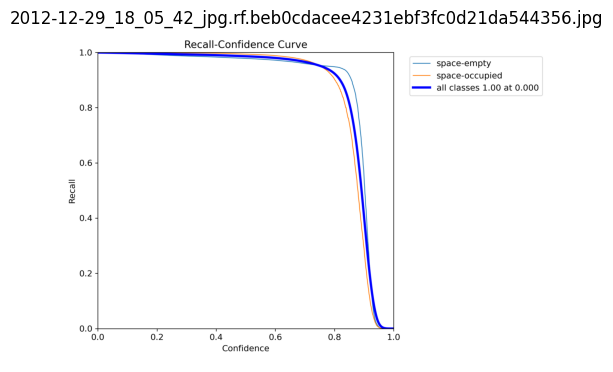

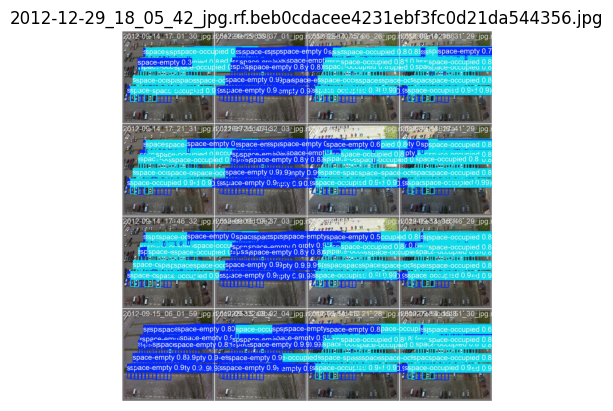

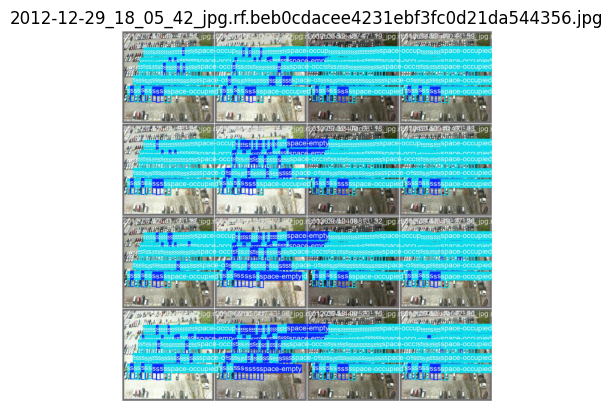

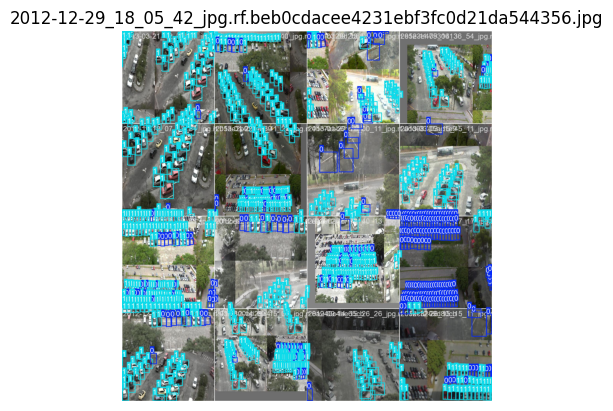

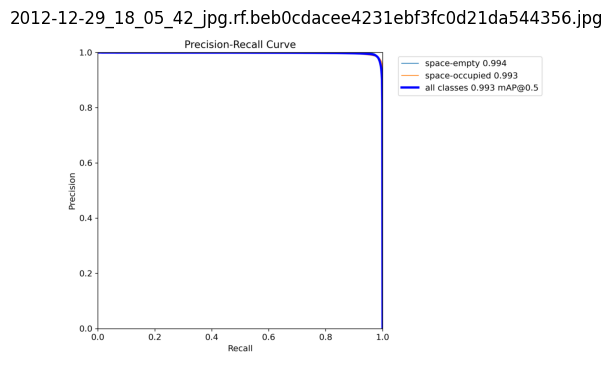

...

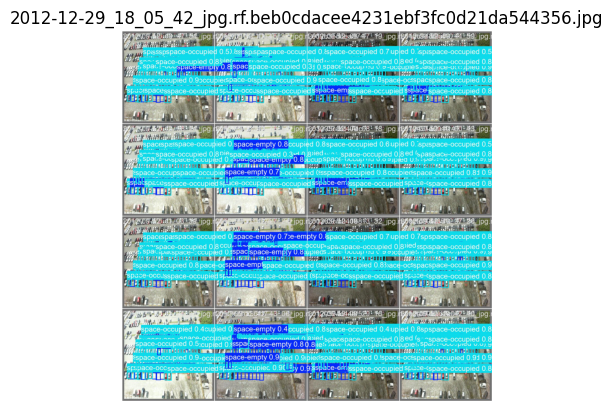

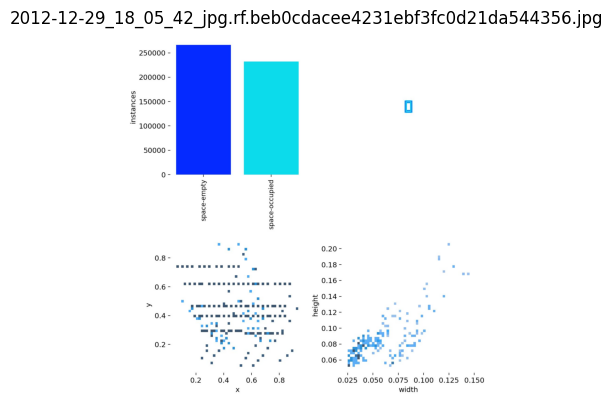

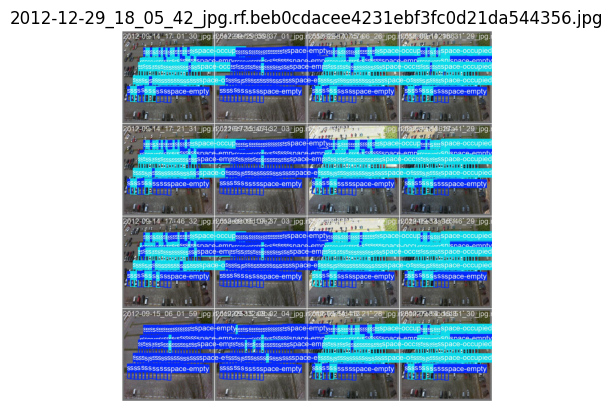

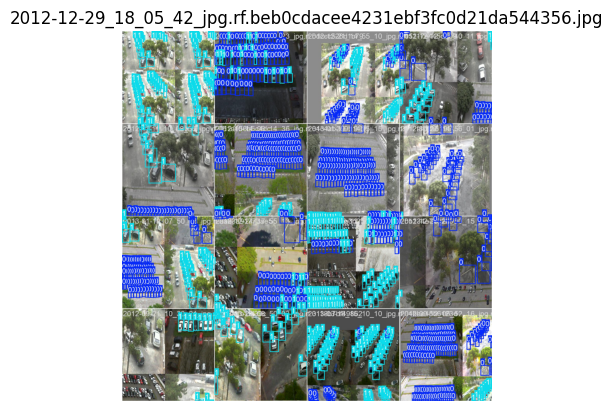

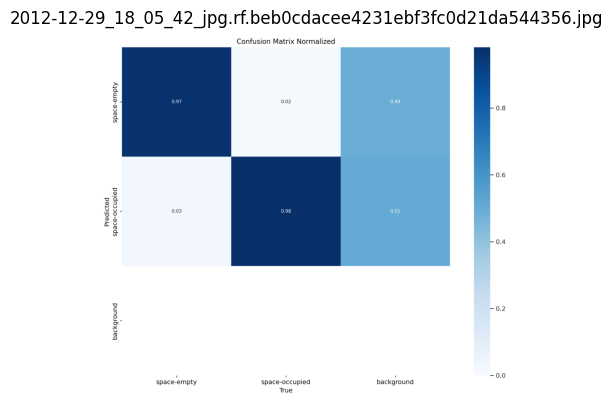

In [30]:
import matplotlib.pyplot as plt
import cv2
import os

# Display a few images from the dataset
worst_model_dir = "parking_project/experiment_yolov8n_batch16_img640_epoch5"

worst_model_metrics = [f for f in os.listdir(worst_model_dir) if f.endswith((".jpg", ".png"))]

for metric in worst_model_metrics:
    img_path = os.path.join(worst_model_dir, metric)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for Matplotlib display
    plt.imshow(img)
    plt.title(image_file)
    plt.axis('off')
    plt.show()


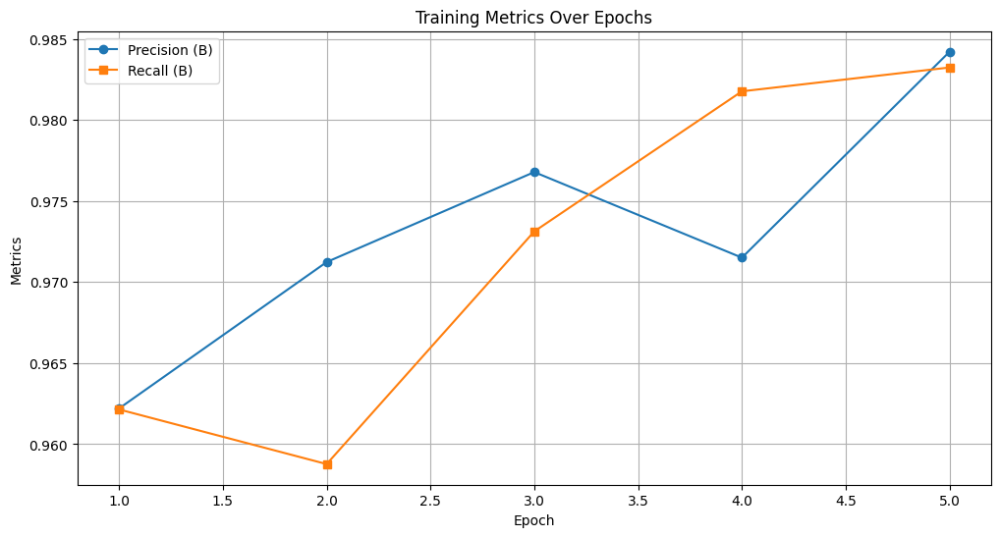

In [35]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
worst_model_results = pd.read_csv('parking_project/experiment_yolov8n_batch16_img640_epoch5/results.csv')

# Plot multiple metrics on the same plot
plt.figure(figsize=(12, 6))
plt.plot(worst_model_results['epoch'], worst_model_results['metrics/precision(B)'], marker='o', label='Precision (B)')
plt.plot(worst_model_results['epoch'], worst_model_results['metrics/recall(B)'], marker='s', label='Recall (B)')

plt.title('Training Metrics Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Metrics')
plt.legend()
plt.grid(True)
plt.show()


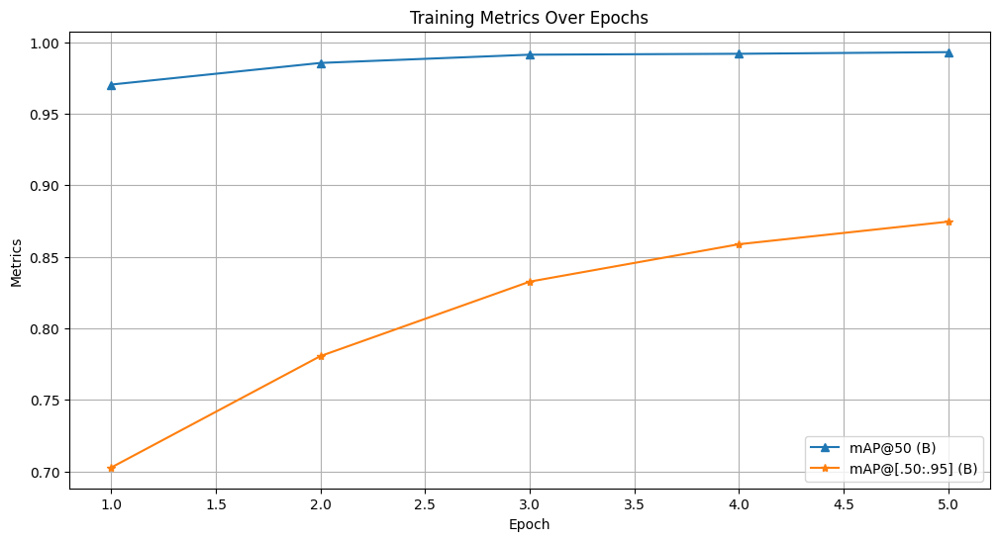

In [36]:
# Plot multiple metrics on the same plot
plt.figure(figsize=(12, 6))
plt.plot(worst_model_results['epoch'], worst_model_results['metrics/mAP50(B)'], marker='^', label='mAP@50 (B)')
plt.plot(worst_model_results['epoch'], worst_model_results['metrics/mAP50-95(B)'], marker='*', label='mAP@[.50:.95] (B)')

plt.title('Training Metrics Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Metrics')
plt.legend()
plt.grid(True)
plt.show()



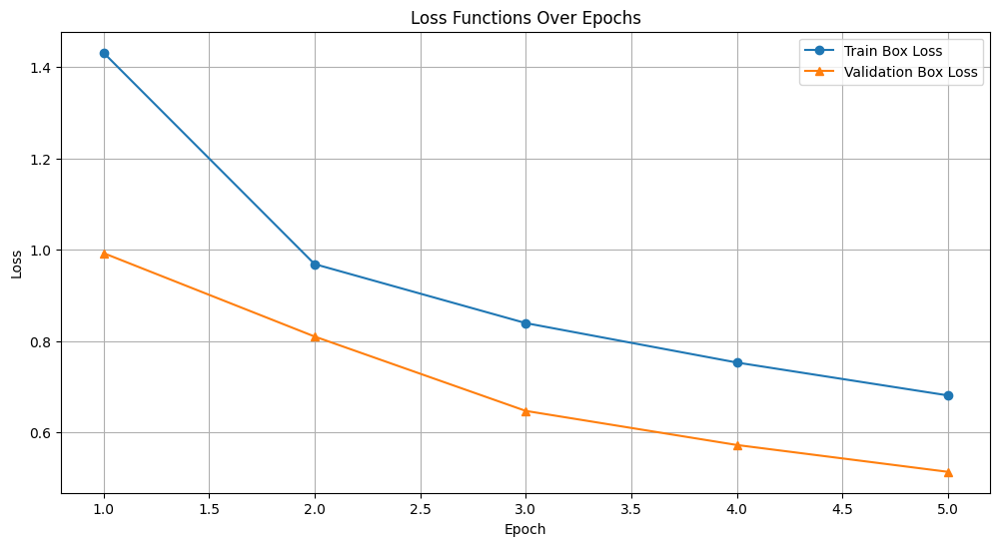

In [41]:
plt.figure(figsize=(12, 6))
plt.plot(worst_model_results['epoch'], worst_model_results['train/box_loss'], marker='o', label='Train Box Loss')
plt.plot(worst_model_results['epoch'], worst_model_results['val/box_loss'], marker='^', label='Validation Box Loss')

plt.title('Loss Functions Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

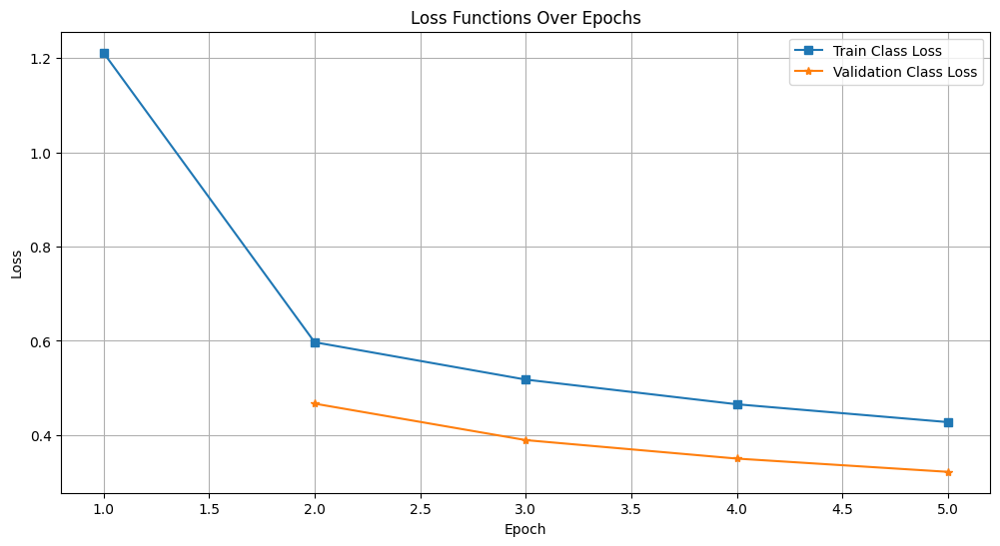

In [40]:
plt.figure(figsize=(12, 6))
plt.plot(worst_model_results['epoch'], worst_model_results['train/cls_loss'], marker='s', label='Train Class Loss')
plt.plot(worst_model_results['epoch'], worst_model_results['val/cls_loss'], marker='*', label='Validation Class Loss')

plt.title('Loss Functions Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

##### Best Model

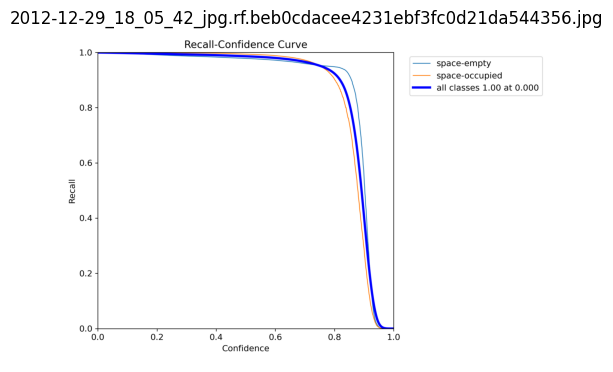

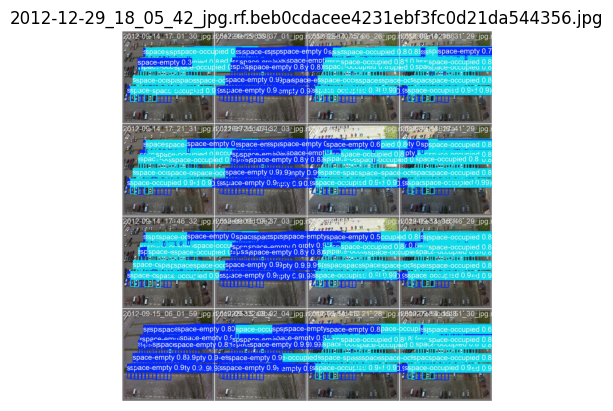

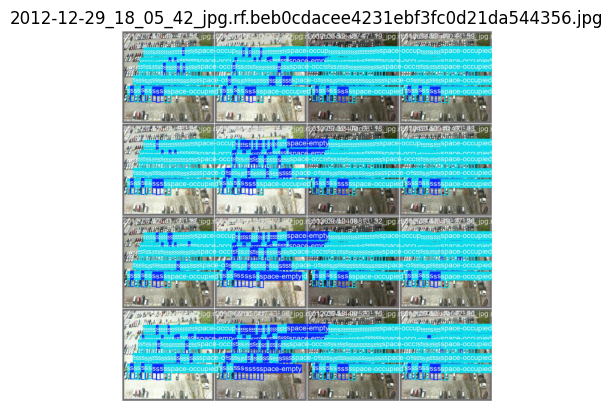

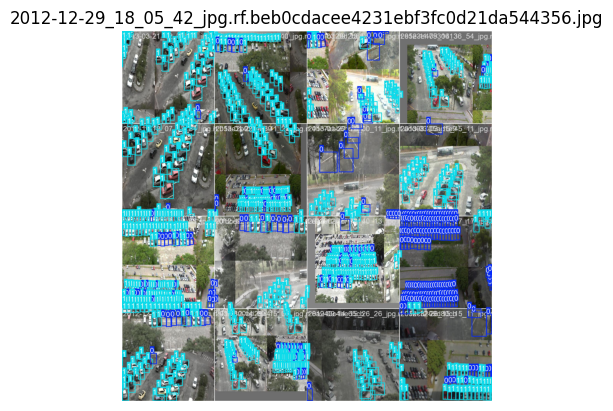

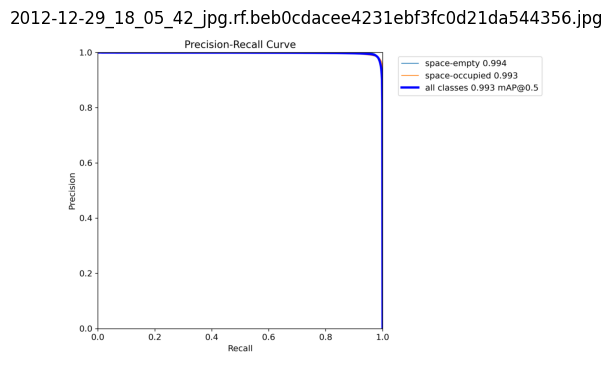

...

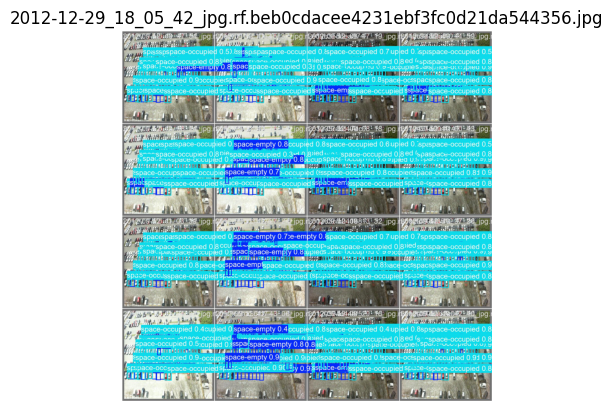

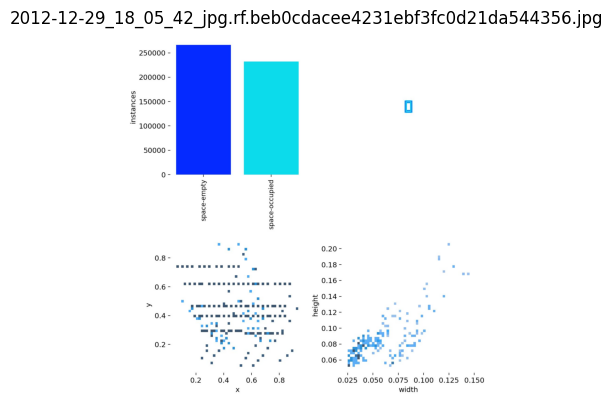

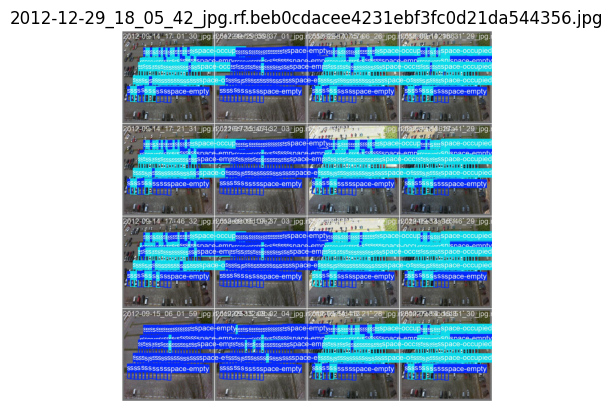

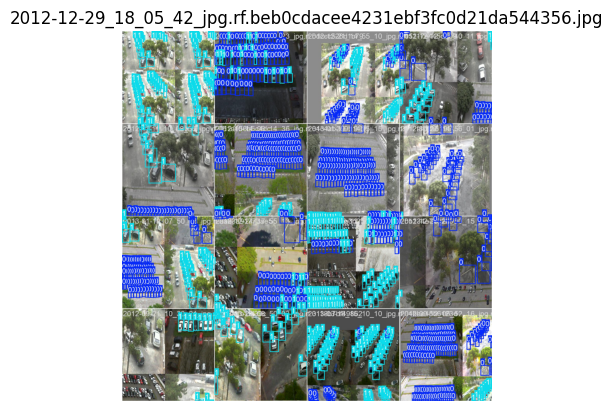

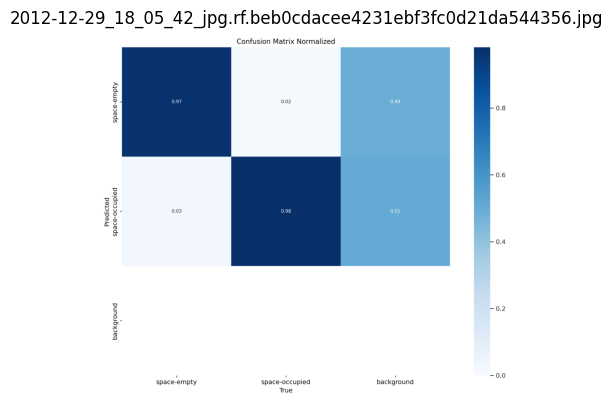

In [31]:
import matplotlib.pyplot as plt
import cv2
import os

# Display a few images from the dataset
best_model_dir = "parking_project/experiment_yolov8s_batch16_img640_epoch5"

best_model_metrics = [f for f in os.listdir(best_model_dir) if f.endswith((".jpg", ".png"))]

for metric in best_model_metrics:
    img_path = os.path.join(worst_model_dir, metric)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.title(image_file)
    plt.axis('off')
    plt.show()


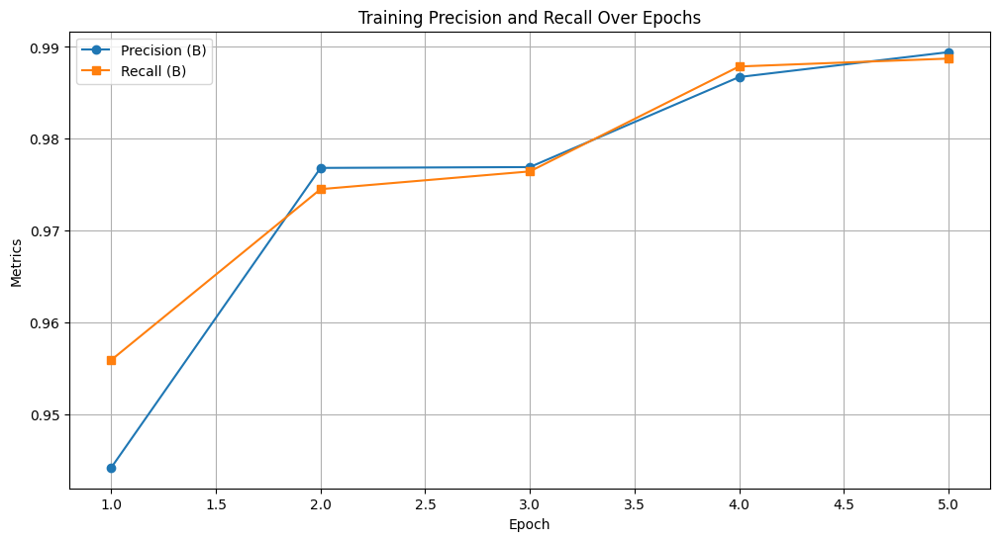

In [47]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the results CSV file
best_model_results = pd.read_csv('parking_project/experiment_yolov8s_batch16_img640_epoch5/results.csv')

# Plot precision and recall
plt.figure(figsize=(12, 6))
plt.plot(best_model_results['epoch'], best_model_results['metrics/precision(B)'], marker='o', label='Precision (B)')
plt.plot(best_model_results['epoch'], best_model_results['metrics/recall(B)'], marker='s', label='Recall (B)')

plt.title('Training Precision and Recall Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Metrics')
plt.legend()
plt.grid(True)
plt.show()

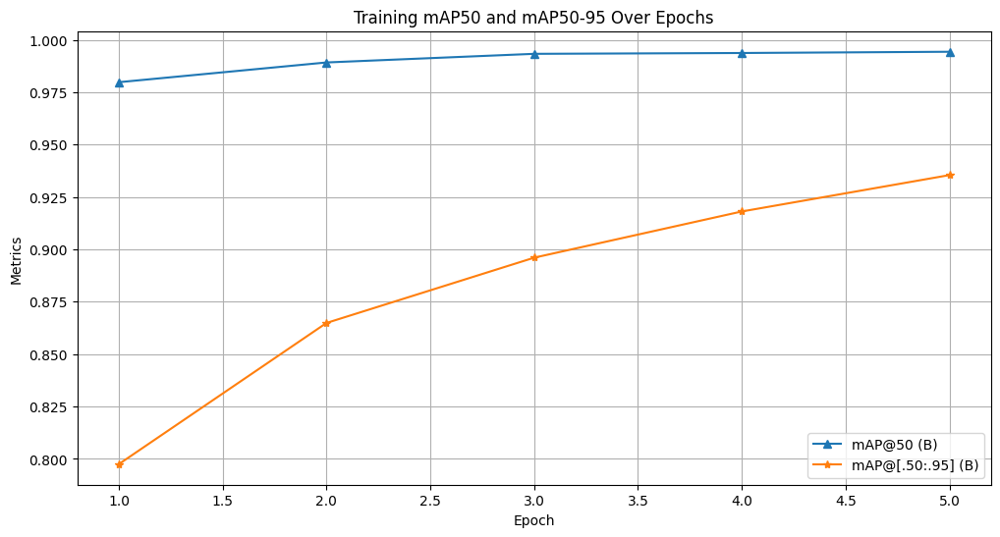

In [46]:
# Plot mAP50 and mAP50-95
plt.figure(figsize=(12, 6))
plt.plot(best_model_results['epoch'], best_model_results['metrics/mAP50(B)'], marker='^', label='mAP@50 (B)')
plt.plot(best_model_results['epoch'], best_model_results['metrics/mAP50-95(B)'], marker='*', label='mAP@[.50:.95] (B)')

plt.title('Training mAP50 and mAP50-95 Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Metrics')
plt.legend()
plt.grid(True)
plt.show()

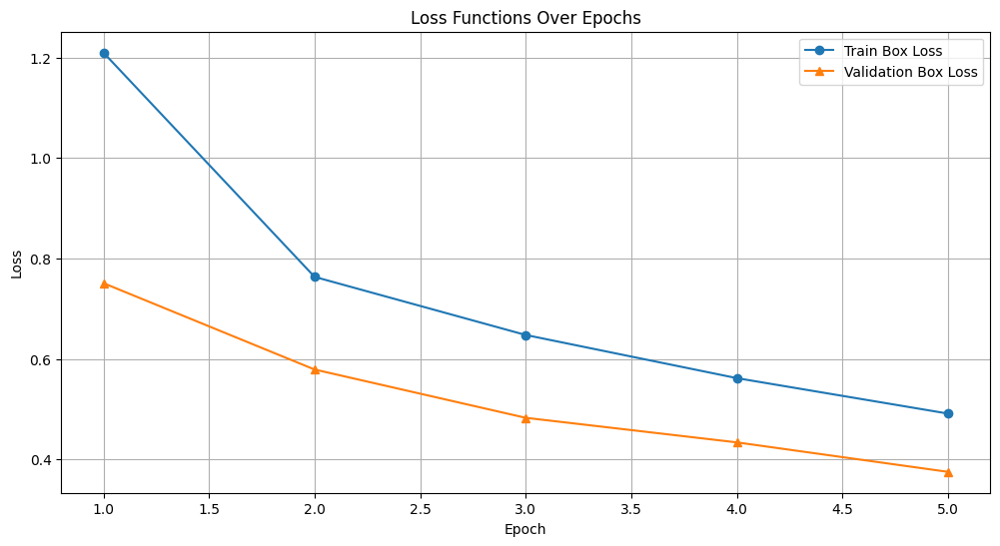

In [44]:
plt.figure(figsize=(12, 6))
plt.plot(best_model_results['epoch'], best_model_results['train/box_loss'], marker='o', label='Train Box Loss')
plt.plot(best_model_results['epoch'], best_model_results['val/box_loss'], marker='^', label='Validation Box Loss')

plt.title('Loss Functions Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

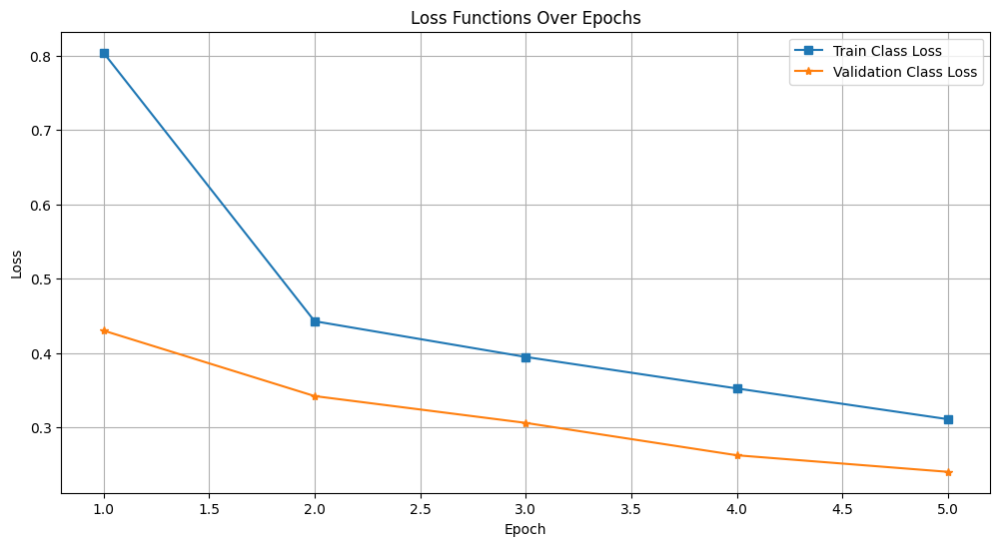

In [45]:
plt.figure(figsize=(12, 6))
plt.plot(best_model_results['epoch'], best_model_results['train/cls_loss'], marker='s', label='Train Class Loss')
plt.plot(best_model_results['epoch'], best_model_results['val/cls_loss'], marker='*', label='Validation Class Loss')

plt.title('Loss Functions Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

## Testing

In [48]:
# Load the best-trained YOLOv8 model
model_path = "parking_project/experiment_yolov8s_batch16_img640_epoch5/weights/best.pt"
YOLO_model = YOLO(model_path)

# Run inference on the test dataset images
test_images_path = "parking_dataset/test/images"
results = YOLO_model.predict(source=test_images_path, save=True, save_txt=True, save_conf=True)

print("Inference completed.")




WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

image 1/1216 /kaggle/working/parking_dataset/test/images/2012-09-11_15_53_00_jpg.rf.8282544a640a23df05bd245a9210e663.jpg: 640x640 28 space-emptys, 74 space-occupieds, 16.2ms
image 2/1216 /kaggle/working/parking_dataset/test/images/2012-09-11_16_48_36_jpg.rf.4ecc8c87c61680ccc73edc218a2c8d7d.jpg: 640x640 25 space-emptys, 79 space-occupieds, 16.3ms
image 3/1216 /kaggle/working/parking_dataset/test/images/2012-09-12_06_36_36_jpg.rf.08869047c7e9f62f5ce93345

In [51]:
# Evaluate the model on the test dataset
metrics = YOLO_model.val(data="/kaggle/working/parking_dataset/data.yaml", split="test")

# Print metrics for analysis
print(metrics)

Ultralytics 8.3.70 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /kaggle/working/parking_dataset/test/labels... 1216 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1216/1216 [00:01<00:00, 887.51it/s]

val: New cache created: /kaggle/working/parking_dataset/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 76/76 [00:36<00:00,  2.10it/s]


                   all       1216      70684      0.988      0.991      0.993      0.938
           space-empty       1041      36584      0.978      0.997      0.992      0.944
        space-occupied        991      34100      0.998      0.985      0.994      0.933


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 9.0ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/val2
ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d7e54929300>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0

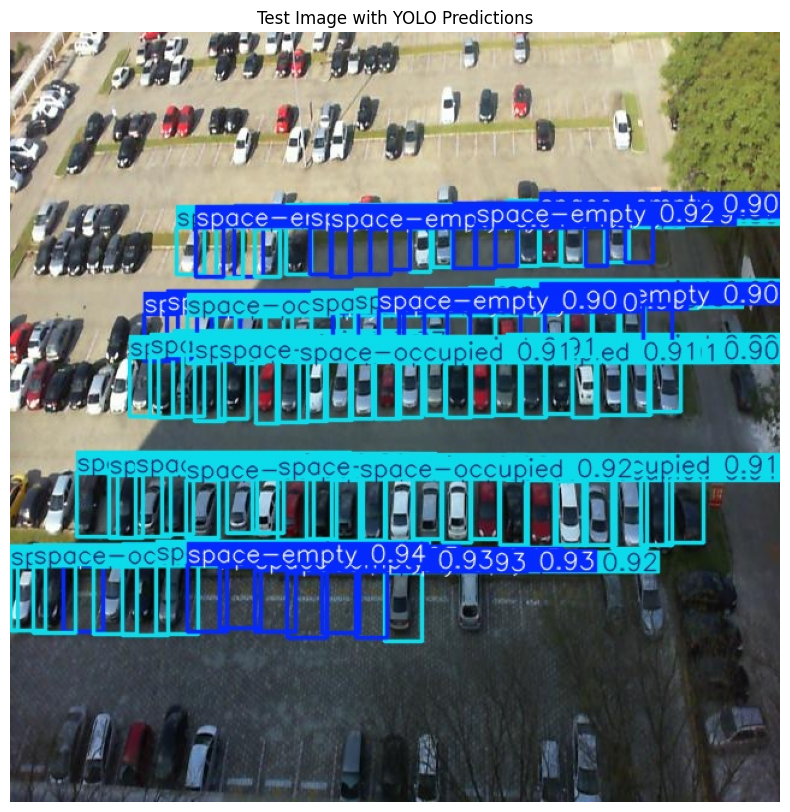

In [58]:
import cv2
import matplotlib.pyplot as plt

# Load and display one of the predicted test images
predicted_image_path = "/kaggle/working/runs/detect/predict/2012-09-11_15_53_00_jpg.rf.8282544a640a23df05bd245a9210e663.jpg"
image = cv2.imread(predicted_image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis('off')
plt.title("Test Image with YOLO Predictions")
plt.show()


## Tryout on a video captured by a surveillence camera in a parking lot

In [3]:
!pip install yt-dlp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.0/172.0 kB 4.1 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 43.3 MB/s eta 0:00:0000:0100:01


In [4]:
import yt_dlp

video_url = "https://www.youtube.com/watch?v=U7HRKjlXK-Y&t=31s&pp=ygUbY2FtZXJhIHN1cnZlaWxsYW5jZSBwYXJraW5n"

ydl_opts = {
    'outtmpl': 'downloaded_video.%(ext)s',
    'format': 'bestvideo+bestaudio/best',
    #'cookiefile': '/kaggle/input/cookiess/cookies.txt',  # Use the cookie file path here
}

with yt_dlp.YoutubeDL(ydl_opts) as ydl:
    ydl.download([video_url])

print("Video download complete!")


[youtube] Extracting URL: https://www.youtube.com/watch?v=U7HRKjlXK-Y&t=31s&pp=ygUbY2FtZXJhIHN1cnZlaWxsYW5jZSBwYXJraW5n
[youtube] U7HRKjlXK-Y: Downloading webpage
[youtube] U7HRKjlXK-Y: Downloading tv client config
[youtube] U7HRKjlXK-Y: Downloading player 0f7c1eff
[youtube] U7HRKjlXK-Y: Downloading tv player API JSON
[youtube] U7HRKjlXK-Y: Downloading ios player API JSON
[youtube] U7HRKjlXK-Y: Downloading m3u8 information
[info] U7HRKjlXK-Y: Downloading 1 format(s): 137+140
[download] Destination: downloaded_video.f137.mp4
[download] 100% of   95.17MiB in 00:00:01 at 52.56MiB/s    
[download] Destination: downloaded_video.f140.m4a
[download] 100% of    4.89MiB in 00:00:00 at 9.36MiB/s   
[Merger] Merging formats into "downloaded_video.mp4"
Deleting original file downloaded_video.f140.m4a (pass -k to keep)
Deleting original file downloaded_video.f137.mp4 (pass -k to keep)
Video download complete!


In [4]:
import cv2
from ultralytics import YOLO

# Load YOLO model
model_path = "/kaggle/input/model-config/best.pt"
YOLO_model = YOLO(model_path)

In [ ]:
# Open the video file
video_path = "downloaded_video.mp4"
cap = cv2.VideoCapture(video_path)

# Get the video frame rate and size
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Create a VideoWriter object to save the processed video
out = cv2.VideoWriter('output_video.avi', cv2.VideoWriter_fourcc(*'mp4v'), fps, (frame_width, frame_height))

while cap.isOpened():
    ret, frame = cap.read()  # Read a frame from the video
    
    if not ret:
        break  # End of video
    
    # Run YOLO model on the frame
    results = YOLO_model.predict(frame, conf=0.5)  # Perform inference with confidence threshold

    # Extract bounding boxes and labels from predictions
    for result in results:
        boxes = result.boxes.xyxy.cpu().numpy()  # Extract bounding box coordinates
        confidences = result.boxes.conf.cpu().numpy()  # Extract confidence scores
        class_ids = result.boxes.cls.cpu().numpy()  # Extract class IDs

        for (x1, y1, x2, y2), conf, class_id in zip(boxes, confidences, class_ids):
            # Skip low-confidence detections
            if conf < 0.5:
                continue

            # Draw the bounding box and label
            color = (0, 255, 0) if int(class_id) == 0 else (0, 0, 255)  # Green for class 0, Red otherwise
            label = 'Free' if int(class_id) == 0 else 'Occupied'
            cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), color, 2)
            cv2.putText(frame, f'{label} {conf:.2f}', (int(x1), int(y1) - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    
    # Write the frame to the output video
    out.write(frame)

# Release resources
cap.release()
out.release()
cv2.destroyAllWindows()

print("Video processing complete! Saved as 'output_video.mp4'.")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.

0: 384x640 (no detections), 379.0ms
Speed: 12.2ms preprocess, 379.0ms inference, 9.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 244.8ms
Speed: 3.1ms preprocess, 244.8ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 229.7ms
Speed: 2.9ms preprocess, 229.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 244.6ms
Speed: 3.1ms preprocess, 244.6ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 233.9ms
Speed: 3.6ms preprocess, 233.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (

In [7]:
# Open the video file
video_path = "downloaded_video.mp4"
cap = cv2.VideoCapture(video_path)

# Get the video frame rate and size
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Create a VideoWriter object to save the processed video
out = cv2.VideoWriter('output_video2.mp4', cv2.VideoWriter_fourcc(*'mp4v'), fps, (frame_width, frame_height))

while cap.isOpened():
    ret, frame = cap.read()  # Read a frame from the video
    
    if not ret:
        break  # End of video
    
    # Run YOLO model on the frame
    results = YOLO_model.predict(frame, conf=0.5)
    print(results[0].boxes)
    # Extract bounding boxes and labels from predictions
    for result in results:
        boxes = result.boxes.xyxy.cpu().numpy()  # Extract bounding box coordinates
        confidences = result.boxes.conf.cpu().numpy()  # Extract confidence scores
        class_ids = result.boxes.cls.cpu().numpy()  # Extract class IDs

        for (x1, y1, x2, y2), conf, class_id in zip(boxes, confidences, class_ids):
            if conf < 0.5:
                continue

            # Draw bounding box and label
            color = (0, 255, 0) if int(class_id) == 0 else (0, 0, 255)
            label = 'Free' if int(class_id) == 0 else 'Occupied'
            cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), color, 2)
            cv2.putText(frame, f'{label} {conf:.2f}', (int(x1), int(y1) - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Write the frame to the output video
    out.write(frame)

cap.release()
out.release()
cv2.destroyAllWindows()

print("Video processing complete! Saved as 'output_video.mp4'.")



0: 384x640 (no detections), 270.0ms
Speed: 3.3ms preprocess, 270.0ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([])
conf: tensor([])
data: tensor([], size=(0, 6))
id: None
is_track: False
orig_shape: (1080, 1920)
shape: torch.Size([0, 6])
xywh: tensor([], size=(0, 4))
xywhn: tensor([], size=(0, 4))
xyxy: tensor([], size=(0, 4))
xyxyn: tensor([], size=(0, 4))

0: 384x640 (no detections), 268.5ms
Speed: 3.5ms preprocess, 268.5ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)
ultralytics.engine.results.Boxes object with attributes:

cls: tensor([])
conf: tensor([])
data: tensor([], size=(0, 6))
id: None
is_track: False
orig_shape: (1080, 1920)
shape: torch.Size([0, 6])
xywh: tensor([], size=(0, 4))
xywhn: tensor([], size=(0, 4))
xyxy: tensor([], size=(0, 4))
xyxyn: tensor([], size=(0, 4))

0: 384x640 (no detections), 265.0ms
Speed: 2.8ms preprocess, 265.0ms inference, 0.6ms postp

KeyboardInterrupt: 

In [7]:
import os
import random
import cv2
from ultralytics import YOLO

# Load YOLO model
model_path = "/kaggle/input/model-config/best.pt"
model_test = YOLO(model_path)

# Image directory path
image_dir = "/kaggle/working/parking_dataset/test/images"

# Get a list of all image files in the directory
image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

if image_files:
    # Choose a random image file
    image_file = random.choice(image_files)
    image_path = os.path.join(image_dir, image_file)

    print(f"Processing image: {image_file}")

    # Load and predict on the selected image
    img = cv2.imread(image_path)
    results = model_test.predict(img, conf=0.1)

    # Save the annotated frame to avoid crashes
    annotated_frame = results[0].plot()
    output_path = "/kaggle/working/output_annotated.jpg"
    cv2.imwrite(output_path, annotated_frame)

    print(f"Annotated image saved at {output_path}.")
else:
    print(f"No image files found in '{image_dir}'.")


Processing image: 2013-02-23_17_20_11_jpg.rf.aa0914e476b6f3d2bc2cc37322c44ec9.jpg

0: 640x640 38 space-emptys, 2 space-occupieds, 425.7ms
Speed: 2.2ms preprocess, 425.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)
Annotated image saved at /kaggle/working/output_annotated.jpg.


In [ ]:
import cv2
from ultralytics import YOLO

# Load YOLO model
model_path = "/kaggle/input/model-config/best.pt"
model_test = YOLO(model_path)

# Video file path
video_path = "/kaggle/working/downloaded_video.mp4"  # Update this with your actual video path
output_path = "/kaggle/working/output_vid.mp4"

# Open the video file
cap = cv2.VideoCapture(video_path)

# Get the video properties
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Create a VideoWriter object to save the processed video
out = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (frame_width, frame_height))

while cap.isOpened():
    ret, frame = cap.read()  # Read a frame from the video
    
    if not ret:
        break  # End of video
    
    # Run YOLO model on the frame
    results = model_test.predict(frame, conf=0.5)  # Perform inference with confidence threshold

    # Draw bounding boxes and annotations
    annotated_frame = results[0].plot()

    # Write the frame to the output video
    out.write(annotated_frame)

# Release resources
cap.release()
out.release()

print(f"Video processing complete! Saved as {output_path}.")



0: 384x640 (no detections), 289.9ms
Speed: 3.4ms preprocess, 289.9ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 284.7ms
Speed: 3.8ms preprocess, 284.7ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 258.5ms
Speed: 3.0ms preprocess, 258.5ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 249.0ms
Speed: 2.8ms preprocess, 249.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 265.9ms
Speed: 3.6ms preprocess, 265.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 243.4ms
Speed: 3.2ms preprocess, 243.4ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 279.1ms
Speed: 3.5ms preprocess, 279.1ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 267.0ms
Speed: 3.2ms prepr